In [9]:
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image

from keras.preprocessing.image import ImageDataGenerator

from torchvision import transforms

Using TensorFlow backend.


In [10]:
ex_datagen = ImageDataGenerator(
    shear_range=10,
    zoom_range=0.2,
    horizontal_flip=True)

In [11]:
# ex_img = np.array(Image.open("data/validation/alien/98.jpg"))
ex_img = np.array(Image.open("Alien-vs.-Predator2.jpg"))

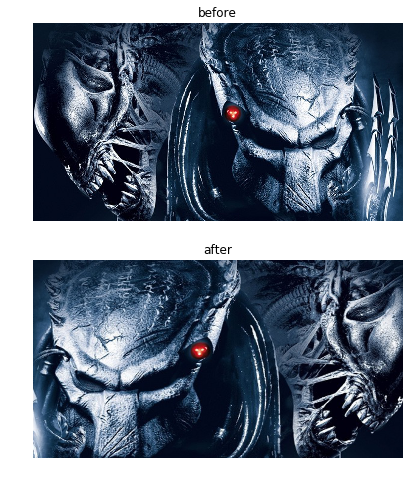

In [12]:
fig, axs = plt.subplots(2, 1, figsize=(8, 8))

ax = axs[0]
ax.axis('off')
ax.set_title("before")
ax.imshow(ex_img)

ax = axs[1]
ax.axis('off')
ax.set_title("after")
ax.imshow(next(ex_datagen.flow(np.expand_dims(ex_img,0))).astype(int)[0])

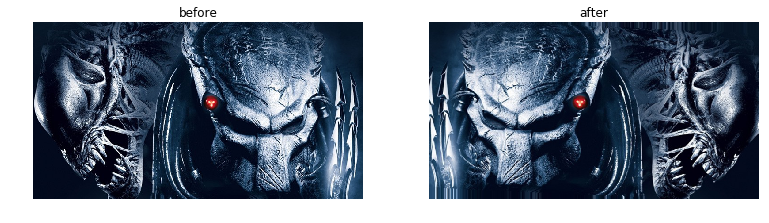

In [13]:
fig, axs = plt.subplots(1, 2, figsize=(13, 13))

ax = axs[0]
ax.axis('off')
ax.set_title("before")
ax.imshow(ex_img)

ax = axs[1]
ax.axis('off')
ax.set_title("after")
ax.imshow(next(ex_datagen.flow(np.expand_dims(ex_img,0))).astype(int)[0])

In [14]:
ex_img_paths = ["data/train/alien/50.jpg",
                "data/train/alien/92.jpg",
                "data/train/predator/188.jpg",
                "data/train/predator/45.jpg"]
img_list = [Image.open(img_path) for img_path in ex_img_paths]

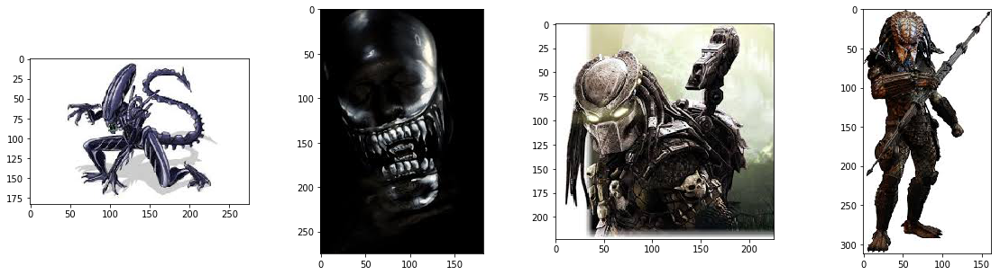

In [65]:
fig, axs = plt.subplots(1, len(img_list), figsize=(20, 5))
for i, img in enumerate(img_list):
    ax = axs[i]
#     ax.axis('off')
    ax.imshow(img)

In [30]:
ex_img_pil = Image.open("Alien-vs.-Predator2.jpg")
ex_img = np.array(ex_img_pil)

In [45]:
ex_datagen = ImageDataGenerator(
    shear_range=10,
    zoom_range=0.2,
    fill_mode='constant',
    horizontal_flip=True)

In [46]:
data_transform = transforms.Compose([
    transforms.RandomAffine(0, shear=10, scale=(0.8,1.2)),        
    transforms.RandomHorizontalFlip()])

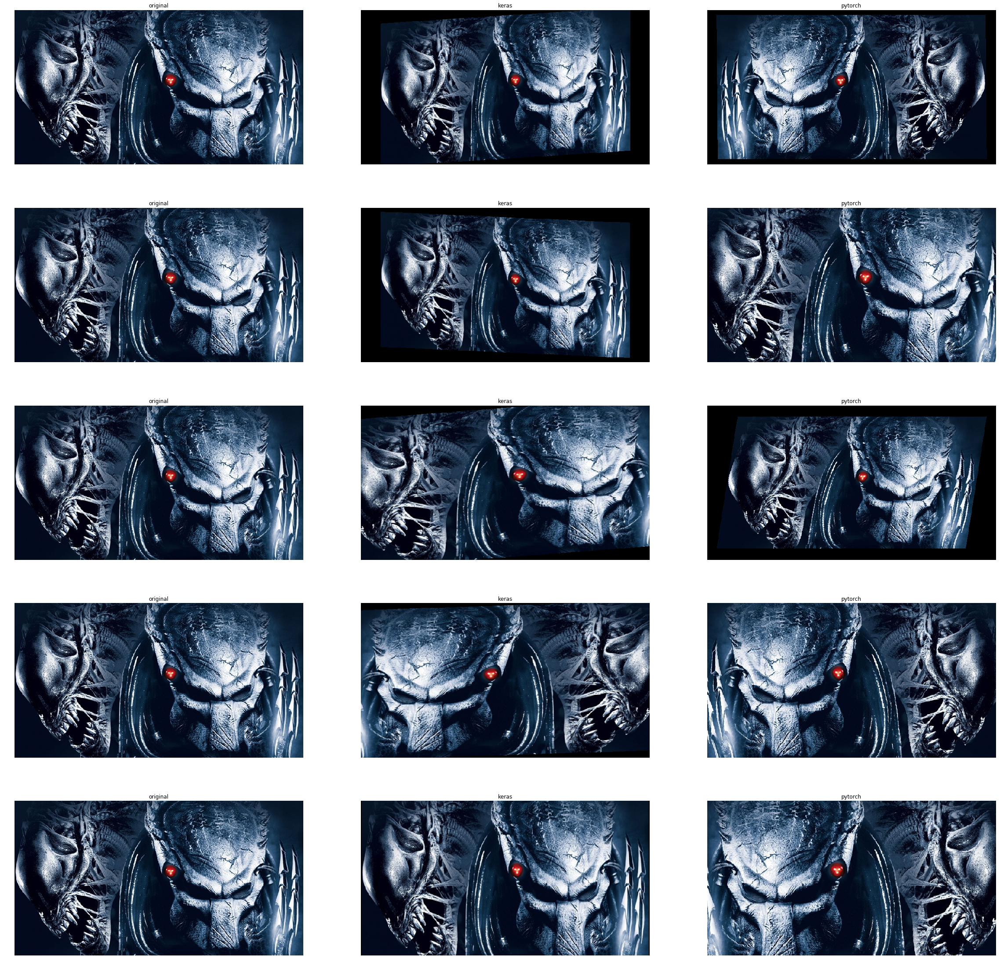

In [64]:
fig, axs = plt.subplots(5, 3, figsize=(40, 40))

for i in range(5):
    ax = axs[i,0]
    ax.axis('off')
    ax.set_title("original")
    ax.imshow(ex_img)

    ax = axs[i,1]
    ax.axis('off')
    ax.set_title("keras")
    ax.imshow(next(ex_datagen.flow(np.expand_dims(ex_img,0))).astype(int)[0])

    ax = axs[i,2]
    ax.axis('off')
    ax.set_title("pytorch")
    ax.imshow(data_transform(ex_img_pil))

In [66]:
from keras.applications.resnet50 import preprocess_input

In [67]:
prep_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

In [68]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

In [91]:
prep_transform = transforms.Compose([
    transforms.ToTensor(),
    normalize])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


TypeError: Invalid dimensions for image data

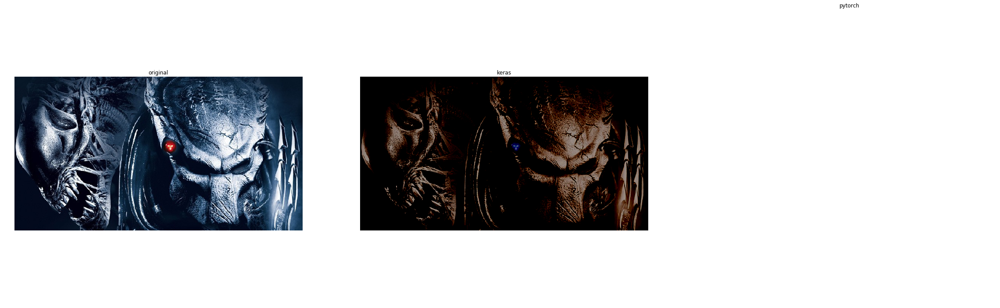

In [93]:
fig, axs = plt.subplots(1, 3, figsize=(40, 40))

ax = axs[0]
ax.axis('off')
ax.set_title("original")
ax.imshow(ex_img)

ax = axs[1]
ax.axis('off')
ax.set_title("keras")
ax.imshow(next(prep_datagen.flow(np.expand_dims(ex_img,0))).astype(int)[0])

ax = axs[2]
ax.axis('off')
ax.set_title("pytorch")
ax.imshow(prep_transform(ex_img_pil).numpy().astype(int))

In [80]:
prep_transform(ex_img_pil).shape

torch.Size([3, 400, 747])

In [113]:
img_keras = next(prep_datagen.flow(np.expand_dims(ex_img,0)))[0]

In [120]:
img_pytorch = prep_transform(ex_img_pil)

In [99]:
prep_transform(ex_img_pil).numpy()[0]

array([[-1.9466565, -1.9980307, -2.0322802, ..., -2.0322802, -1.9980307,
        -1.9637812],
       [-1.9466565, -1.9980307, -2.0322802, ..., -2.0322802, -1.9980307,
        -1.9637812],
       [-1.9466565, -1.9980307, -2.0151556, ..., -2.0322802, -1.9980307,
        -1.9637812],
       ...,
       [-2.0151556, -2.117904 , -2.0665298, ..., -1.7411594, -1.7240347,
        -1.7240347],
       [-2.0151556, -2.117904 , -2.0665298, ..., -1.7240347, -1.7240347,
        -1.7240347],
       [-2.0151556, -2.117904 , -2.0665298, ..., -1.7069099, -1.7069099,
        -1.6897851]], dtype=float32)

In [102]:
next(prep_datagen.flow(np.expand_dims(ex_img,0)))[0][:,:,0]

array([[-61.939003, -64.939   , -66.939   , ..., -66.939   , -64.939   ,
        -62.939003],
       [-61.939003, -64.939   , -66.939   , ..., -66.939   , -64.939   ,
        -62.939003],
       [-61.939003, -64.939   , -65.939   , ..., -66.939   , -64.939   ,
        -62.939003],
       ...,
       [-70.939   , -77.939   , -73.939   , ..., -19.939003, -18.939003,
        -18.939003],
       [-70.939   , -77.939   , -73.939   , ..., -18.939003, -18.939003,
        -18.939003],
       [-70.939   , -77.939   , -73.939   , ..., -17.939003, -17.939003,
        -16.939003]], dtype=float32)

In [108]:
prep_transform(ex_img_pil)

tensor([[[-1.9467, -1.9980, -2.0323,  ..., -2.0323, -1.9980, -1.9638],
         [-1.9467, -1.9980, -2.0323,  ..., -2.0323, -1.9980, -1.9638],
         [-1.9467, -1.9980, -2.0152,  ..., -2.0323, -1.9980, -1.9638],
         ...,
         [-2.0152, -2.1179, -2.0665,  ..., -1.7412, -1.7240, -1.7240],
         [-2.0152, -2.1179, -2.0665,  ..., -1.7240, -1.7240, -1.7240],
         [-2.0152, -2.1179, -2.0665,  ..., -1.7069, -1.7069, -1.6898]],

        [[-1.5805, -1.6331, -1.6681,  ..., -1.6681, -1.6331, -1.5980],
         [-1.5805, -1.6331, -1.6681,  ..., -1.6681, -1.6331, -1.5980],
         [-1.5805, -1.6331, -1.6506,  ..., -1.6681, -1.6331, -1.5980],
         ...,
         [-1.7906, -1.9132, -1.8431,  ..., -1.0553, -1.0378, -1.0378],
         [-1.7906, -1.9132, -1.8431,  ..., -1.0378, -1.0378, -1.0378],
         [-1.7906, -1.9132, -1.8431,  ..., -1.0203, -1.0203, -1.0028]],

        [[-1.0724, -1.1247, -1.1596,  ..., -1.1596, -1.1247, -1.0898],
         [-1.0724, -1.1247, -1.1596,  ..., -1

In [109]:
transforms.ToTensor(ex_img_pil)

TypeError: object() takes no parameters

In [119]:
img_keras[:,:,0].mean(), img_keras[:,:,1].mean(), img_keras[:,:,2].mean()

(-14.504898, -48.339855, -70.890495)

In [124]:
img_pytorch[0,:,:].mean()

tensor(-1.2139)

In [131]:
tens_transform = transforms.Compose([
    transforms.ToTensor()
])
tens_transform(ex_img_pil) * 255

tensor([[[ 10.,   7.,   5.,  ...,   5.,   7.,   9.],
         [ 10.,   7.,   5.,  ...,   5.,   7.,   9.],
         [ 10.,   7.,   6.,  ...,   5.,   7.,   9.],
         ...,
         [  6.,   0.,   3.,  ...,  22.,  23.,  23.],
         [  6.,   0.,   3.,  ...,  23.,  23.,  23.],
         [  6.,   0.,   3.,  ...,  24.,  24.,  25.]],

        [[ 26.,  23.,  21.,  ...,  21.,  23.,  25.],
         [ 26.,  23.,  21.,  ...,  21.,  23.,  25.],
         [ 26.,  23.,  22.,  ...,  21.,  23.,  25.],
         ...,
         [ 14.,   7.,  11.,  ...,  56.,  57.,  57.],
         [ 14.,   7.,  11.,  ...,  57.,  57.,  57.],
         [ 14.,   7.,  11.,  ...,  58.,  58.,  59.]],

        [[ 42.,  39.,  37.,  ...,  37.,  39.,  41.],
         [ 42.,  39.,  37.,  ...,  37.,  39.,  41.],
         [ 42.,  39.,  38.,  ...,  37.,  39.,  41.],
         ...,
         [ 33.,  26.,  30.,  ...,  84.,  85.,  85.],
         [ 33.,  26.,  30.,  ...,  85.,  85.,  85.],
         [ 33.,  26.,  30.,  ...,  86.,  86.,  87.]]]

In [132]:
ex_img_pil.mode

'RGB'